# DATA ANALYSIS

## 1st stage: transforming the dataset Profiles by adding new columns


In [1]:
import pandas as pd
df=pd.read_csv('profil_ml_member.csv' , sep=",")

The goal was to connect this dataset with the dataset with demographique information on metropolitan areas and have for the same values (age & gender) the same label

In [96]:
df

,gender,age,income,member
0,F,55,112000.0,1
1,F,75,100000.0,1
2,M,68,70000.0,1
3,M,65,53000.0,1
4,M,58,51000.0,1
...,...,...,...,...
14608,F,45,54000.0,1
14609,M,61,72000.0,1
14610,M,49,73000.0,1
14611,F,83,50000.0,1


In [111]:
import pandas as pd

age_bins = [0, 19, 24, 29, 34, 39, 44, 49, 54, 59, 64, 69, 74, 79, 84, 110]
age_labels = [
    'AGE1519',
    'AGE2024',
    'AGE2529',
    'AGE3034',
    'AGE3539',
    'AGE4044',
    'AGE4549',
    'AGE5054',
    'AGE5559',
    'AGE6064',
    'AGE6569',
    'AGE7074',
    'AGE7579',
    'AGE8084',
    'AGE85PLUS'
]

gender_mapping = {
    'M': 'MALE',
    'F': 'FEMALE'
}

new_categories = [f'{age}_{gender}' for age in age_labels for gender in gender_mapping.values()]

df['age_group'] = pd.cut(df['age'], bins=age_bins, labels=age_labels)
df['gender'] = df['gender'].map(gender_mapping)
df['age_group'] = df['age_group'].astype(str) + '_' + df['gender'].astype(str)

# Mapping the new_categories
df['age_group'] = df['age_group'].map(lambda x: x if x in new_categories else 'OTHER')




In [112]:
df

,gender,age,income,member,age_group
0,FEMALE,55,112000.0,1,AGE5559_FEMALE
1,FEMALE,75,100000.0,1,AGE7579_FEMALE
2,MALE,68,70000.0,1,AGE6569_MALE
3,MALE,65,53000.0,1,AGE6569_MALE
4,MALE,58,51000.0,1,AGE5559_MALE
...,...,...,...,...,...
14608,FEMALE,45,54000.0,1,AGE4549_FEMALE
14609,MALE,61,72000.0,1,AGE6064_MALE
14610,MALE,49,73000.0,1,AGE4549_MALE
14611,FEMALE,83,50000.0,1,AGE8084_FEMALE


In [77]:
df.groupby("age_group")["member"].count().sort_values(ascending=False)


age_group
AGE5559_MALE        967
AGE5054_MALE        958
AGE6064_MALE        854
AGE5559_FEMALE      814
AGE4549_MALE        760
AGE6569_MALE        748
AGE5054_FEMALE      746
AGE6064_FEMALE      735
AGE4044_MALE        674
AGE6569_FEMALE      615
AGE7074_MALE        561
AGE3539_MALE        544
AGE4549_FEMALE      501
AGE7074_FEMALE      499
AGE2529_MALE        491
AGE2024_MALE        469
AGE3034_MALE        464
AGE7579_MALE        364
AGE85PLUS_FEMALE    346
AGE4044_FEMALE      334
AGE7579_FEMALE      333
AGE3539_FEMALE      288
AGE8084_FEMALE      273
AGE8084_MALE        244
AGE85PLUS_MALE      226
AGE3034_FEMALE      207
AGE2529_FEMALE      200
AGE2024_FEMALE      193
AGE1519_MALE        160
AGE1519_FEMALE       45
Name: member, dtype: int64

In [101]:
df.head(100)

,gender,age,income,member
0,F,55,112000.0,1
1,F,75,100000.0,1
2,M,68,70000.0,1
3,M,65,53000.0,1
4,M,58,51000.0,1
...,...,...,...,...
95,F,51,56000.0,1
96,F,64,37000.0,1
97,M,71,57000.0,1
98,F,64,66000.0,1


## 2nd stage: Once the dataset on profiles have been transformed different analysis are made by using different charts

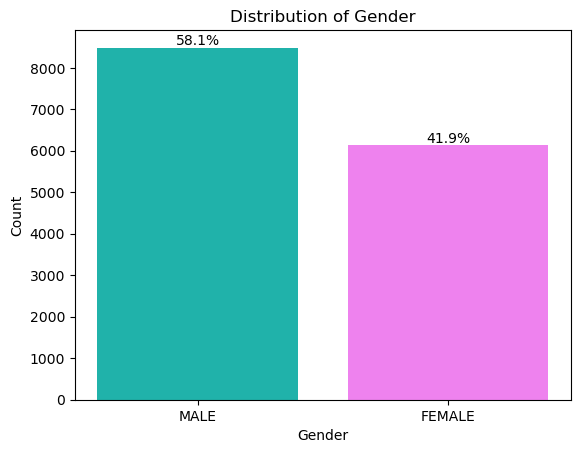

In [136]:
import matplotlib.pyplot as plt

gender_counts = df['gender'].value_counts()
labels = gender_counts.index
values = gender_counts.values

total = sum(values)
percentages = [(value / total) * 100 for value in values]

colors = ['lightseagreen', 'violet']

plt.bar(labels, values, color=colors)
plt.xlabel('Gender')
plt.ylabel('Count')
plt.title('Distribution of Gender')

# Add percentage labels inside the bars
for i, value in enumerate(values):
    percentage = percentages[i]
    plt.text(i, value, f'{percentage:.1f}%', ha='center', va='bottom')

plt.show()




In [103]:
# this chart has not been retained for the final analysis
import plotly.express as px

fig = px.box(df, x='gender', y='income', color='gender', title='Income Distribution by Gender')
fig.show()

In [120]:
# this chart has not been retained for the final analysis an updated version was created
fig = px.box(df, x='age_group', y='income', color='gender', title='Income Distribution by Age Group')

fig.show()

In [121]:
# this chart has not been retained for the final analysis
import plotly.express as px


fig = px.box(df, x='age_group', y='income', color='gender', title='Income Distribution by Age Group')
fig.add_hline(y=56000)
fig.add_annotation(
    y=56000, x=df['age_group'].max(),
    text='USA Average Salary',
    showarrow=False  
)
customer_avg_income = df['income'].mean()
fig.add_hline(y=customer_avg_income, line_color='green', annotation_text='Members Average Income')

fig.show()


In [128]:
# this chart has been used as it shows in the same time clearly the distribution of income by different sex
import plotly.express as px


fig = px.box(df, x='age_group', y='income', color='gender', title='Income Distribution by Age Group',
              color_discrete_map={'MALE': 'lightseagreen', 'FEMALE': 'violet'})

fig.add_hline(y=56000)
fig.add_annotation(
    y=56000, x=df['age_group'].max(),
    text='USA Average Salary',
    showarrow=False  
)
customer_avg_income = df['income'].mean()
fig.add_hline(y=customer_avg_income, line_color='blue', annotation_text='Members Average Income')

fig.show()


In [138]:
import plotly.express as px


df_sorted = df.sort_values(by=['gender', 'age'])

fig = px.box(df_sorted, x='age_group', y='income', color='gender', title='Income Distribution by Age Group',
              color_discrete_map={'MALE': 'lightseagreen', 'FEMALE': 'violet'})

fig.add_hline(y=56000)
fig.add_annotation(
    y=56000, x=df_sorted['age_group'].max(),
    text='USA Average Salary',
    showarrow=False  
)
customer_avg_income = df_sorted['income'].mean()
fig.add_hline(y=customer_avg_income, line_color='blue', annotation_text='Members Average Income')

fig.show()


In [104]:
# this chart is not retain as it has visual shortcomings. It may be that the red scatter hides the blue one behind
fig = px.scatter(df, x='income', y='age', color='gender', title='Age vs. Income', 
                 hover_data=['gender'], trendline='ols')
fig.add_vline(x = 56000)
fig.add_annotation(
    x=56000, y=df['age'].max(),
    text='USA Average Salary',
    showarrow=False  
)
customer_aver_income = df['income'].mean()
fig.add_vline(fig.add_vline(x=customer_aver_income, line_color='green', annotation_text='Members Average Income')
)

fig.show()
 

         

In [105]:

# this chart has not been retained for the final analysis
color_mapping = {'Male': 'mint', 'Female': 'violet'}


fig = px.bar(df, x='income', y='age', color='gender', title='Age vs. Income',
             color_discrete_map=color_mapping)

fig.add_vline(x=56000)
fig.add_annotation(
    x=56000, y=df['age'].max(),
    text='USA Average Salary',
    showarrow=False  
)
customer_avg_income = df['income'].mean()
fig.add_vline(x=customer_avg_income, line_color='green', annotation_text='Members Average Income')



fig.show()





In [110]:
import plotly.express as px

# this chart has not been retained for the final analysis, there is a probleme with the axes
fig = px.bar(df, x="income", y="age",
             color='gender', barmode='group')

fig.add_vline(x=56000)
fig.add_annotation(
    x=56000, y=df['income'].max(),
    text='USA Average Salary',
    showarrow=False  
)
customer_avg_income = df['income'].mean()
fig.add_vline(x=customer_avg_income, line_color='green', annotation_text='Members Average Income')
fig.update_layout(yaxis=dict(range=[0, df['income'].max()]))

fig.show()



In [38]:

# piechart showing the top 5 demographique categories of members
import plotly.express as px
import pandas as pd

# Calculate the count of members in each age group
age_group_counts = df['age_group'].value_counts().reset_index()
age_group_counts.columns = ['age_group', 'count']

# Sort the age groups based on the counts
age_group_counts = age_group_counts.sort_values('count', ascending=False)

# Filter the DataFrame for the top 10 members in each age group
top_10_members = df[df['age_group'].isin(age_group_counts.head(5)['age_group'])]

fig = px.sunburst(top_10_members, path=['age_group'], values='member',
                  color='gender',
                  color_discrete_map={'Male': 'blue', 'Female': 'green'},
                  title='Top 5 Members Distribution by Age Group and Gender')
fig.update_traces(textinfo='label+percent parent', insidetextorientation='radial')
fig.show()





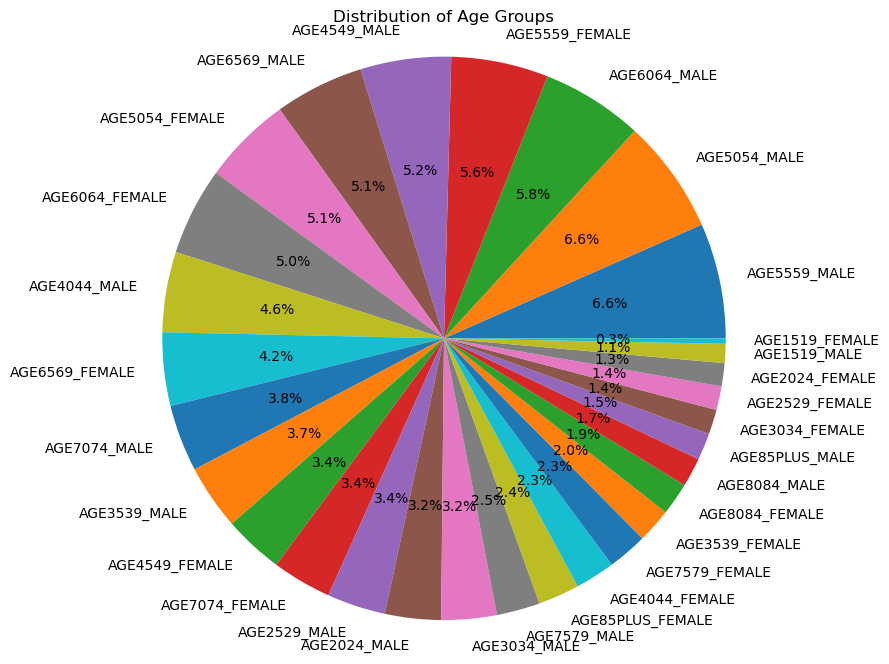

In [13]:
# this chart has not been retained for the final analysis
import plotly.express as px
age_group_counts = df['age_group'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(8, 8))
plt.pie(age_group_counts, labels=age_group_counts.index, autopct='%1.1f%%')
plt.title('Distribution of Age Groups')
plt.axis('equal')

# Display the chart
plt.show()

In [14]:
# this chart has not been retained for the final analysis
import plotly.express as px
import pandas as pd

# Calculate the percentage distribution
age_group_counts = df['age_group'].value_counts()
age_group_percentages = age_group_counts / len(df) * 100

age_group_df = pd.DataFrame({'Age Group': age_group_percentages.index, 'Percentage': age_group_percentages.values})

# Define colors for M (male) and F (female)
color_map = {'MALE': 'blue', 'FEMALE': 'pink'}

fig = px.bar(age_group_df, x='Age Group', y='Percentage',
             color_discrete_map=color_map,
             title='Percentage Distribution of Members by Age Group',
             labels={'Age Group': 'Age Group', 'Percentage': 'Percentage'})

fig.show()






In [15]:

color_map = {'MALE': 'blue', 'FEMALE': 'pink'}
df['Color'] = df['gender'].map(color_map)

fig = px.bar(df, x='age_group', color='Color',
             title='Distribution of Members by Age Group and Gender',
             labels={'age_group': 'Age Group'})




In [16]:
# this chart has not been retained for the final analysis
import plotly.graph_objects as go

# Calculate the count of each age group
age_group_counts = df['age_group'].value_counts().reset_index()
age_group_counts.columns = ['age_group', 'count']

# Sort the age groups based on the maximum counts
age_group_counts = age_group_counts.sort_values('count', ascending=False)

fig = px.bar(df, x='age_group', color='gender',
             title='Distribution of Members by Age Group and Gender',
             labels={'age_group': 'Age Group'})

# Set the order of age groups on the x-axis based on maximum counts
fig.update_layout(xaxis={'categoryorder': 'array', 'categoryarray': age_group_counts['age_group'].tolist()})

# Update the color for a specific gender
gender_color_map = {'MALE': 'blue', 'FEMALE': 'orange'}
for trace in fig.data:
    if trace.name in gender_color_map:
        trace.marker.color = gender_color_map[trace.name]

fig.show()


## 3rd stage: Searching for the "Starbucks profiles" in different Metropolitan areas and where we have a demography wich is mostly like those profiles

In [17]:
import pandas as pd
dfcityandstores=pd.read_csv('df_propre.csv' , sep=",")

In [18]:
dfcityandstores

,2019,2020,2021,prediction_mean,State/Province_x,City_State,Count,City,Longitude,Latitude,...,AGE7579_FEMALE,AGE8084_TOTAL,AGE8084_MALE,AGE8084_FEMALE,AGE85PLUS_TOTAL,AGE85PLUS_MALE,AGE85PLUS_FEMALE,MEDIAN_AGE_TOTAL,MEDIAN_AGE_MALE,MEDIAN_AGE_FEMALE
0,51827,55232,58735,0.909252,OH,"Akron, OH",10,Akron,-81.51,41.08,...,12275,14011,5805,8206,13859,4963,8896,40.7,39.7,41.8
1,38118,42006,45619,0.904930,GA,"Albany, GA",3,Albany,-84.22,31.61,...,2430,2656,1021,1635,2383,738,1645,37.6,35.9,39.0
2,44501,48357,52695,0.856468,OR,"Albany-Lebanon, OR",6,Albany-Lebanon,-122.91,44.53,...,2342,2756,1213,1543,2176,832,1344,39.8,39.0,40.6
3,59477,63951,67788,0.914221,NY,"Allentown-Bethlehem-Easton, PA-NJ",7,Albany-Schenectady-Troy,-73.68,42.74,...,15810,17818,7474,10344,18979,6456,12523,40.6,39.4,41.7
4,44884,48514,52263,0.856468,NM,"Albuquerque, NM",37,Albuquerque,-106.69,35.18,...,15928,17658,7732,9926,15532,5999,9533,39.2,38.2,40.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285,55671,60364,64540,0.904944,MACT,"Worcester, MA-CT",3,Worcester,-71.81,42.29,...,15158,17303,7209,10094,18179,6041,12138,40.4,39.4,41.4
286,43208,47315,50872,0.866906,WA,"Yakima, WA",11,Yakima,-120.56,46.62,...,3393,4135,1848,2287,3808,1444,2364,33.1,32.4,33.7
287,51295,54808,57870,0.890291,PA,"York-Hanover, PA",9,York-Hanover,-76.99,39.83,...,8002,9399,4105,5294,9061,3198,5863,41.0,40.0,42.1
288,42450,46009,48904,0.894352,OHPA,"Youngstown-Warren-Boardman, OH-PA",3,Youngstown-Warren-Boardman,-80.68,41.02,...,11336,13683,5597,8086,14291,4840,9451,43.8,42.0,45.8


In [19]:
dfcityandstores['starbucks_percapita'] = dfcityandstores['POPESTIMATE']/dfcityandstores['Count']

In [20]:
dfcityandstores

,2019,2020,2021,prediction_mean,State/Province_x,City_State,Count,City,Longitude,Latitude,...,AGE8084_TOTAL,AGE8084_MALE,AGE8084_FEMALE,AGE85PLUS_TOTAL,AGE85PLUS_MALE,AGE85PLUS_FEMALE,MEDIAN_AGE_TOTAL,MEDIAN_AGE_MALE,MEDIAN_AGE_FEMALE,starbucks_percapita
0,51827,55232,58735,0.909252,OH,"Akron, OH",10,Akron,-81.51,41.08,...,14011,5805,8206,13859,4963,8896,40.7,39.7,41.8,70001.500000
1,38118,42006,45619,0.904930,GA,"Albany, GA",3,Albany,-84.22,31.61,...,2656,1021,1635,2383,738,1645,37.6,35.9,39.0,49257.666667
2,44501,48357,52695,0.856468,OR,"Albany-Lebanon, OR",6,Albany-Lebanon,-122.91,44.53,...,2756,1213,1543,2176,832,1344,39.8,39.0,40.6,21639.833333
3,59477,63951,67788,0.914221,NY,"Allentown-Bethlehem-Easton, PA-NJ",7,Albany-Schenectady-Troy,-73.68,42.74,...,17818,7474,10344,18979,6456,12523,40.6,39.4,41.7,128469.428571
4,44884,48514,52263,0.856468,NM,"Albuquerque, NM",37,Albuquerque,-106.69,35.18,...,17658,7732,9926,15532,5999,9533,39.2,38.2,40.4,24817.810811
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285,55671,60364,64540,0.904944,MACT,"Worcester, MA-CT",3,Worcester,-71.81,42.29,...,17303,7209,10094,18179,6041,12138,40.4,39.4,41.4,326149.000000
286,43208,47315,50872,0.866906,WA,"Yakima, WA",11,Yakima,-120.56,46.62,...,4135,1848,2287,3808,1444,2364,33.1,32.4,33.7,23275.909091
287,51295,54808,57870,0.890291,PA,"York-Hanover, PA",9,York-Hanover,-76.99,39.83,...,9399,4105,5294,9061,3198,5863,41.0,40.0,42.1,50966.222222
288,42450,46009,48904,0.894352,OHPA,"Youngstown-Warren-Boardman, OH-PA",3,Youngstown-Warren-Boardman,-80.68,41.02,...,13683,5597,8086,14291,4840,9451,43.8,42.0,45.8,179356.333333


In [21]:
dfcityandstores.columns.tolist()

['2019',
 '2020',
 '2021',
 'prediction_mean',
 'State/Province_x',
 'City_State',
 'Count',
 'City',
 'Longitude',
 'Latitude',
 'POPESTIMATE',
 'POPEST_MALE',
 'POPEST_FEMALE',
 'UNDER5_TOTAL',
 'UNDER5_MALE',
 'UNDER5_FEMALE',
 'AGE513_TOTAL',
 'AGE513_MALE',
 'AGE513_FEMALE',
 'AGE1417_TOTAL',
 'AGE1417_MALE',
 'AGE1417_FEMALE',
 'AGE1824_TOTAL',
 'AGE1824_MALE',
 'AGE1824_FEMALE',
 'AGE16PLUS_TOTAL',
 'AGE16PLUS_MALE',
 'AGE16PLUS_FEMALE',
 'AGE18PLUS_TOTAL',
 'AGE18PLUS_MALE',
 'AGE18PLUS_FEMALE',
 'AGE1544_TOTAL',
 'AGE1544_MALE',
 'AGE1544_FEMALE',
 'AGE2544_TOTAL',
 'AGE2544_MALE',
 'AGE2544_FEMALE',
 'AGE4564_TOTAL',
 'AGE4564_MALE',
 'AGE4564_FEMALE',
 'AGE65PLUS_TOTAL',
 'AGE65PLUS_MALE',
 'AGE65PLUS_FEMALE',
 'AGE04_TOTAL',
 'AGE04_MALE',
 'AGE04_FEMALE',
 'AGE59_TOTAL',
 'AGE59_MALE',
 'AGE59_FEMALE',
 'AGE1014_TOTAL',
 'AGE1014_MALE',
 'AGE1014_FEMALE',
 'AGE1519_TOTAL',
 'AGE1519_MALE',
 'AGE1519_FEMALE',
 'AGE2024_TOTAL',
 'AGE2024_MALE',
 'AGE2024_FEMALE',
 'AGE2529_T

In [23]:
# looking for the metropolitan areas with least starbucks per capita/ chart however not retained
import plotly.graph_objects as go

# Sort the dataframe by 'nb_personne_starbucks' in ascending order
sorted_cities = dfcityandstores.sort_values('starbucks_percapita', ascending=True)

# Select the last 30 cities
last_30_cities = sorted_cities[-30:]

City_State_x = last_30_cities['City_State']
nb_personne_starbucks = last_30_cities['starbucks_percapita']

# Create bar chart
fig = go.Figure(data=go.Bar(x=City_State_x, y=nb_personne_starbucks))

# Set chart title and axis labels
fig.update_layout(
    title='Number of People per Starbucks by City (Last 30)',
    xaxis_title='City',
    yaxis_title='Number of Coffee Shops per capita'
)

# Display the chart
fig.show()


In [24]:
import plotly.graph_objects as go

# Calculate the sum of the specified columns
dfcityandstores['Total_Sum'] = dfcityandstores[
    ['AGE5054_MALE', 'AGE5559_MALE', 'AGE6064_MALE', 'AGE4549_MALE', 'AGE5559_FEMALE']
].sum(axis=1)

# Group the data by the sum and calculate the sum for each group
grouped_data = dfcityandstores.groupby('City_State')['Total_Sum'].sum().reset_index()

# Sort the data by the sum in descending order and select the top 30 groups
sorted_data = grouped_data.sort_values('Total_Sum', ascending=False).head(30)

City_State_x = sorted_data['City_State']
total_sum = sorted_data['Total_Sum']

# Create bar chart
fig = go.Figure(data=go.Bar(x=City_State_x, y=total_sum))

# Set chart title and axis labels
fig.update_layout(
    title='Sum of Age Categories by City (Top 30)',
    xaxis_title='City',
    yaxis_title='Sum of Age Categories'
)

# Display the chart
fig.show()


### 3.1 choosing the metropoletan areas on the basis of the 5 top Starbucks demographic categories 
#### charts not retain for the final analysis

In [25]:
import plotly.graph_objects as go

# Calculate the sum of the specified columns
dfcityandstores['Total_Sum'] = dfcityandstores[
    ['AGE5054_MALE', 'AGE5559_MALE', 'AGE6064_MALE', 'AGE4549_MALE', 'AGE5559_FEMALE']
].sum(axis=1)

# Filter the data to include only cities with average salary >= 65000
filtered_data = dfcityandstores[dfcityandstores['2021'] >= 65000]

# Sort the filtered data by the sum in descending order and select the top 30 groups
sorted_data = filtered_data.sort_values('Total_Sum', ascending=False).head(30)

City_State_x = sorted_data['City_State']
total_sum = sorted_data['Total_Sum']

# Create bar chart
fig = go.Figure()
fig.add_trace(go.Bar(x=City_State_x, y=total_sum, name='Sum of Age Categories'))

# Set chart title and axis labels
fig.update_layout(
    title='Sum of Age Categories by City (Top 30)',
    xaxis_title='City',
    yaxis_title='Sum of Age Categories'
)

# Display the chart
fig.show()



In [26]:
import plotly.graph_objects as go

# Calculate the sum of the specified columns
dfcityandstores['Total_Sum'] = dfcityandstores[
    ['AGE5054_MALE', 'AGE5559_MALE', 'AGE6064_MALE', 'AGE4549_MALE', 'AGE5559_FEMALE']
].sum(axis=1)

# Calculate the average of the "starbucks_percapita" column
average_starbucks_percapita = dfcityandstores['starbucks_percapita'].mean()

# Filter the data to include only cities that meet both conditions
filtered_data = dfcityandstores[
    (dfcityandstores['2021'] >= 65000) & (dfcityandstores['starbucks_percapita'] >= average_starbucks_percapita)
]

# Sort the filtered data by the sum in descending order and select the top 30 groups
sorted_data = filtered_data.sort_values('Total_Sum', ascending=False).head(30)

City_State_x = sorted_data['City_State']
total_sum = sorted_data['Total_Sum']

# Create bar chart
fig = go.Figure()
fig.add_trace(go.Bar(x=City_State_x, y=total_sum, name='Sum of Age Categories'))

# Set chart title and axis labels
fig.update_layout(
    title='Sum of Age Categories by City (Top 30)',
    xaxis_title='City',
    yaxis_title='Sum of Age Categories'
)

# Display the chart
fig.show()


### 3.2 choosing the metropoletan areas on the basis of the 10 top Starbucks demographic categories 
 

In [39]:

import plotly.express as px
import pandas as pd

# Calculate the count of members in each age group
age_group_counts = df['age_group'].value_counts().reset_index()
age_group_counts.columns = ['age_group', 'count']

# Sort the age groups based on the counts
age_group_counts = age_group_counts.sort_values('count', ascending=False)

# Filter the DataFrame for the top 10 members in each age group
top_10_members = df[df['age_group'].isin(age_group_counts.head(10)['age_group'])]

fig = px.sunburst(top_10_members, path=['age_group'], values='member',
                  color='gender',
                  color_discrete_map={'Male': 'blue', 'Female': 'green'},
                  title='Top 10 Members Distribution by Age Group and Gender')
fig.update_traces(textinfo='label+percent parent', insidetextorientation='radial')
fig.show()


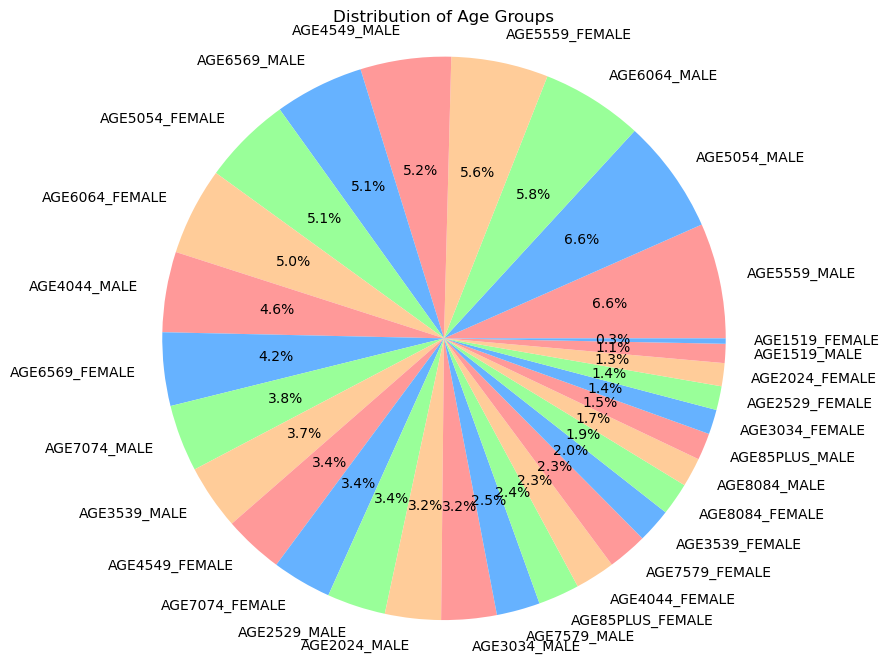

In [28]:
import matplotlib.pyplot as plt

age_group_counts = df['age_group'].value_counts()

# Define a custom color palette
colors = ['#FF9999', '#66B2FF', '#99FF99', '#FFCC99']

# Plotting the pie chart with custom colors
plt.figure(figsize=(8, 8))
plt.pie(age_group_counts, labels=age_group_counts.index, autopct='%1.1f%%', colors=colors)
plt.title('Distribution of Age Groups')
plt.axis('equal')

# Display the chart
plt.show()



In [56]:
import pandas as pd

age_group_counts = df['age_group'].value_counts()

# Calculate the sum of percentages for the first 10 biggest categories
sum_percentages = age_group_counts.head(5).sum() / age_group_counts.sum() * 100

# Display the sum of percentages
print("Sum of Percentages:", sum_percentages)


Sum of Percentages: 29.788544446725517


In [30]:
import pandas as pd

# Filter the DataFrame for the top 10 categories
top_10_categories = df['age_group'].value_counts().head(10).index

# Filter the DataFrame for the top 10 categories and gender
top_10_data = df[df['age_group'].isin(top_10_categories)]

# Calculate the sum of counts for each gender in the top 10 categories
gender_counts = top_10_data['gender'].value_counts()

# Calculate the percentage of men and women
total_count = gender_counts.sum()
percentage_men = (gender_counts['MALE'] / total_count) * 100
percentage_women = (gender_counts['FEMALE'] / total_count) * 100

# Display the percentages
print("Percentage of Men:", percentage_men)
print("Percentage of Women:", percentage_women)


Percentage of Men: 63.028840045737525
Percentage of Women: 36.97115995426248


In [31]:
import plotly.graph_objects as go

# Calculate the sum of the specified columns
dfcityandstores['Total_Sum'] = dfcityandstores[
    ['AGE5054_MALE', 'AGE5559_MALE', 'AGE6064_MALE', 'AGE4549_MALE', 'AGE5559_FEMALE', 'AGE6569_MALE', 'AGE5054_FEMALE', 'AGE6064_FEMALE', 'AGE4044_MALE', 'AGE6569_MALE' ]
].sum(axis=1)

# Group the data by the sum and calculate the sum for each group
grouped_data = dfcityandstores.groupby('City_State')['Total_Sum'].sum().reset_index()

# Sort the data by the sum in descending order and select the top 30 groups
sorted_data = grouped_data.sort_values('Total_Sum', ascending=False).head(30)

City_State_x = sorted_data['City_State']
total_sum = sorted_data['Total_Sum']

# Create bar chart
fig = go.Figure(data=go.Bar(x=City_State_x, y=total_sum, marker_color='darkgreen'))

# Set chart title and axis labels
fig.update_layout(
    title='Cities ordered by the sum of the population in the most represented age categories within the Starbucks members (Top 30)',
    xaxis_title='City',
    yaxis_title='Sum of Age Categories'
)

# Display the chart
fig.show()

In [42]:
import plotly.graph_objects as go

# Calculate the sum of the specified columns
dfcityandstores['Total_Sum'] = dfcityandstores[
    ['AGE5054_MALE', 'AGE5559_MALE', 'AGE6064_MALE', 'AGE4549_MALE', 'AGE5559_FEMALE', 'AGE6569_MALE', 'AGE5054_FEMALE', 'AGE6064_FEMALE', 'AGE4044_MALE', 'AGE6569_MALE']
].sum(axis=1)

# Filter the data to include only cities with average salary >= 65000
filtered_data = dfcityandstores[dfcityandstores['2021'] >= 65000]

# Sort the filtered data by the sum in descending order and select the top 30 groups
sorted_data = filtered_data.sort_values('Total_Sum', ascending=False).head(30)

City_State_x = sorted_data['City_State']
total_sum = sorted_data['Total_Sum']

# Create bar chart
fig = go.Figure()
fig.add_trace(go.Bar(x=City_State_x, y=total_sum, name='Sum of Age Categories', marker_color='darkgreen'))

# Set chart title and axis labels
fig.update_layout(
    title='Cities ordered by the sum of the population in the most represented age categories within the Starbucks members, <br> with average salary => 65000',
    xaxis_title='City',
    yaxis_title='Sum of Age Categories'
)

# Display the chart
fig.show()

In [45]:
# FINAL CHOICE OF METROPOLITAN AREAS USING AS A RESULT OF THE DATA ANALYSIS PROCESS
import plotly.graph_objects as go

# Calculate the sum of the specified columns
dfcityandstores['Total_Sum'] = dfcityandstores[
    ['AGE5054_MALE', 'AGE5559_MALE', 'AGE6064_MALE', 'AGE4549_MALE', 'AGE5559_FEMALE', 'AGE6569_MALE', 'AGE5054_FEMALE', 'AGE6064_FEMALE', 'AGE4044_MALE', 'AGE6569_MALE']
].sum(axis=1)

# Calculate the average of the "starbucks_percapita" column
average_starbucks_percapita = dfcityandstores['starbucks_percapita'].mean()

# Filter the data to include only cities that meet both conditions
filtered_data = dfcityandstores[
    (dfcityandstores['2021'] >= 65000) & (dfcityandstores['starbucks_percapita'] >= average_starbucks_percapita)
]

# Sort the filtered data by the sum in descending order and select the top 30 groups
sorted_data = filtered_data.sort_values('Total_Sum', ascending=False).head(30)

City_State_x = sorted_data['City_State']
total_sum = sorted_data['Total_Sum']

# Create bar chart
fig = go.Figure()
fig.add_trace(go.Bar(x=City_State_x, y=total_sum, marker_color='green', name='Cities ordered by the sum of the population in the most represented age categories within the Starbucks members, <br> with average salary => 65000 & with Stabucks cofee shop density below the average'))

# Set chart title and axis labels
fig.update_layout(
    title='Sum of Age Categories by City (Top 30)',
    xaxis_title='City',
    yaxis_title='Sum of Age Categories'
)

# Display the chart
fig.show()

In [54]:
dfsorted_data = pd.DataFrame(sorted_data)

# Display the new DataFrame
print(dfsorted_data['City_State'])


                                  City_State  starbucks_percapita
179  Miami-Fort Lauderdale-Pompano Beach, FL         71667.611765
37            Boston-Cambridge-Newton, MA-NH         64472.789474
183  Minneapolis-St. Paul-Bloomington, MN-WI         99743.567568
41           Bridgeport-Stamford-Norwalk, CT         87251.636364
3          Allentown-Bethlehem-Easton, PA-NJ        128469.428571
273                              Vallejo, CA         64530.857143
268                    Trenton-Princeton, NJ        128632.666667
214                           Pittsfield, MA         64328.500000


In [55]:
average_starbucks_percapita

63316.22473343865